In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import muon as mu
from muon import prot as pt
from muon import rna as rna
import os
from mudata import MuData
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/si

In [2]:
sc.set_figure_params(frameon=False, figsize=(4, 4))

In [3]:
mdata = mu.read('/Users/anasuyadighe/Downloads/20230616_GAP-hashed-persamplenorm-iter2.h5mu')

In [4]:
mdata

MuData object with n_obs × n_vars = 60263 × 19086
  var:	'gene_ids', 'feature_types', 'genome'
  2 modalities
    rna:	57471 x 19059
      obs:	'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden'
      var:	'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
      uns:	'hashing_colors', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
      obsm:	'X_pca', 'X_umap', 'hash_onoff'
      varm:	'PCs'
      obsp:	'connectivities', 'distances'
    prot:	60263 x 27
      obs:	'sample'
      var:	'gene_ids', 'feature_types', 'genome'
      uns:	'neighbors', 'pca', 'sample_colors', 'umap'
      obsm:	'X_pca', 'X_umap'
      varm:	'PCs'
      layers:	'counts'
      obsp:	'connectivities', 'distances'

In [5]:
rna = mdata.mod['rna']
prot = mdata.mod['prot']

In [6]:
rna_sing = rna[rna.obs['hashing'].str.contains('1.0')]
prot_sing = prot[rna_sing.obs_names]

In [7]:
hash_data = prot[:, :6].copy().to_df()
hash_data['sample'] = prot.obs['sample']


In [43]:
hash_data

,Hashtag1_TotalSeqB,Hashtag2_TotalSeqB,Hashtag3_TotalSeqB,Hashtag4_TotalSeqB,Hashtag5_TotalSeqB,Hashtag6_TotalSeqB,sample,leiden
AAACAAGCATGGATTG-1-P1-TD-d8,13.623221,7.367730,4.323073,3.718673,9.155756,4.191432,P1-TD-d8,14
AAACCAATCTAATTGC-1-P1-TD-d8,4.122584,3.483558,9.203765,3.513347,4.738729,12.768611,P1-TD-d8,2
AAACCAGGTCATGAAG-1-P1-TD-d8,2.812624,4.054366,4.094949,3.640638,2.683031,11.941731,P1-TD-d8,2
AAACGGGCAAGTTAAC-1-P1-TD-d8,2.497146,4.825302,2.330774,8.999466,10.782969,9.563780,P1-TD-d8,11
AAACGGGCAGAAAGGT-1-P1-TD-d8,3.334355,2.571099,7.182946,5.227791,3.073711,2.729862,P1-TD-d8,10
...,...,...,...,...,...,...,...,...
TTTGTGAGTTAATTCG-1-P6-T4-d15,5.902713,26.459734,8.151190,9.294083,0.992473,1.001785,P6-T4-d15,1
TTTGTGAGTTCAAGGA-1-P6-T4-d15,4.188711,11.669479,18.137760,11.315475,0.976202,0.972871,P6-T4-d15,6
TTTGTGAGTTGCGGCT-1-P6-T4-d15,5.196664,9.609532,15.567600,42.107780,0.994170,1.004801,P6-T4-d15,21
TTTGTGAGTTGGCGAG-1-P6-T4-d15,7.664575,26.699080,5.410088,8.677883,0.999444,1.014172,P6-T4-d15,12


In [44]:
prot.var

,gene_ids,feature_types,genome
Hashtag1_TotalSeqB,Hashtag1,Antibody Capture,
Hashtag2_TotalSeqB,Hashtag2,Antibody Capture,
Hashtag3_TotalSeqB,Hashtag3,Antibody Capture,
Hashtag4_TotalSeqB,Hashtag4,Antibody Capture,
Hashtag5_TotalSeqB,Hashtag5,Antibody Capture,
Hashtag6_TotalSeqB,Hashtag6,Antibody Capture,
Ly6C_TotalSeqB,Ly6C,Antibody Capture,
MHCII_TotalSeqB,MHCII,Antibody Capture,
CD64_TotalSeqB,CD64,Antibody Capture,
CSF1R_TotalSeqB,CSF1R,Antibody Capture,


In [8]:
sc.tl.leiden(rna)
hash_data = hash_data.loc[rna.obs_names.values]
hash_data['leiden'] = rna.obs['leiden']
# updating to include leiden clustering (to distinguish CD45 +/-)

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/anasuyadighe/anaconda3/envs/scrna

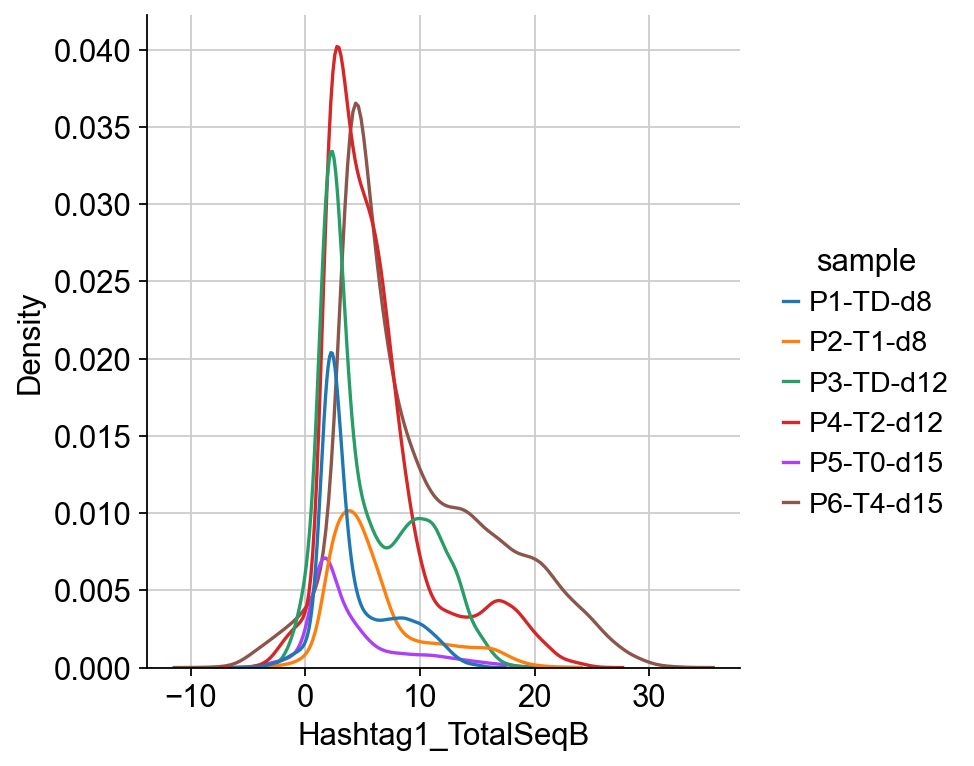

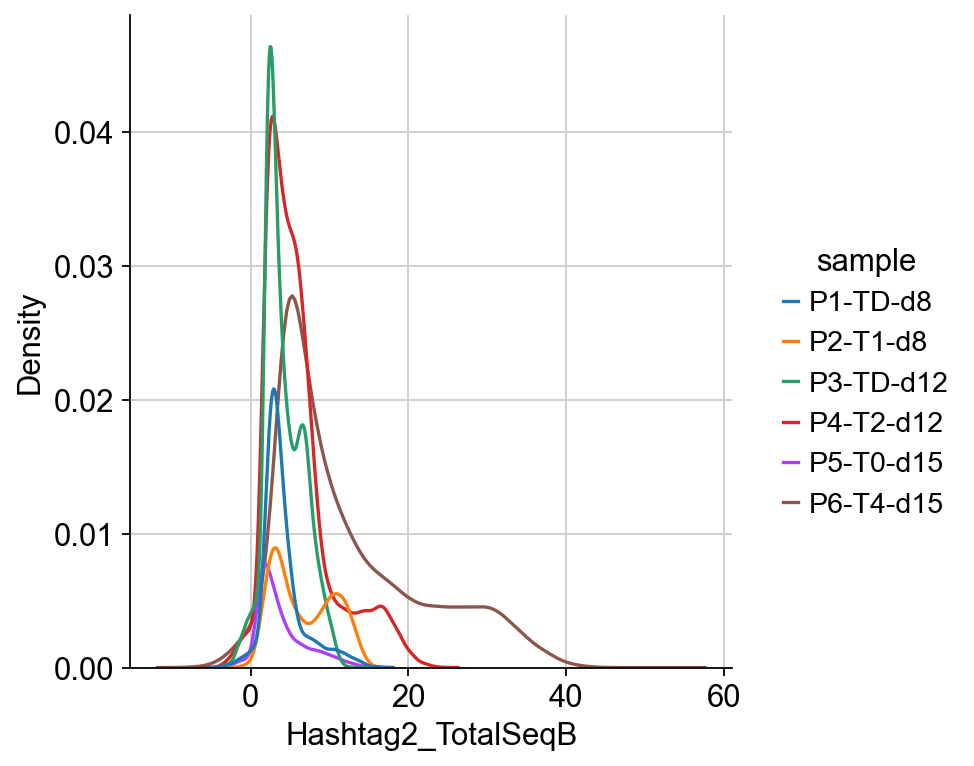

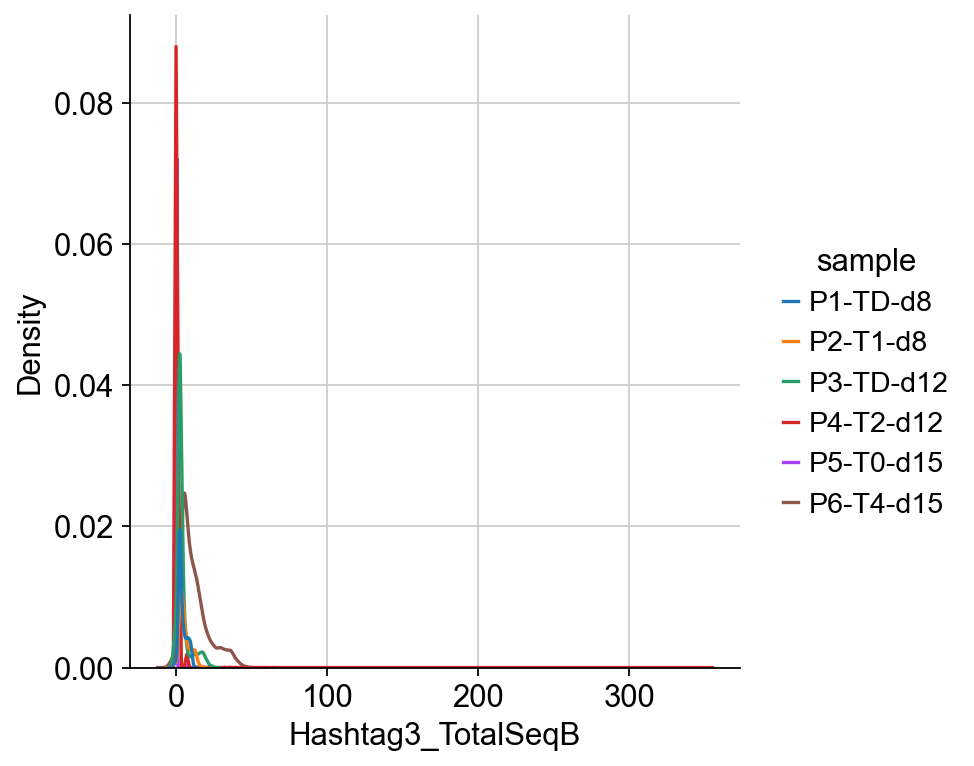

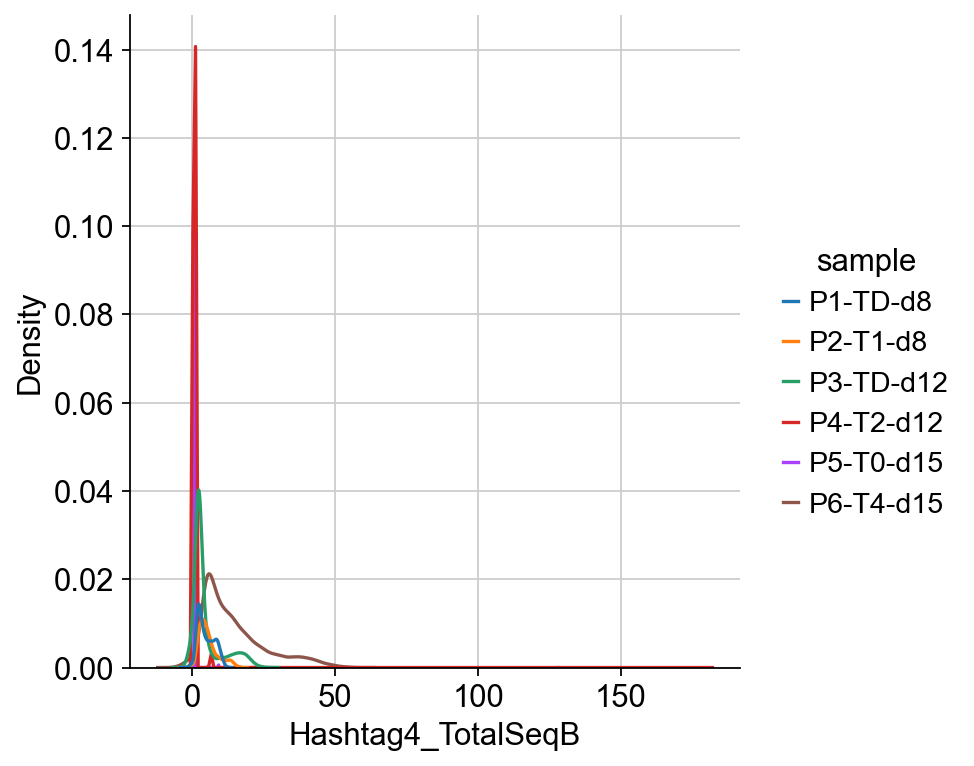

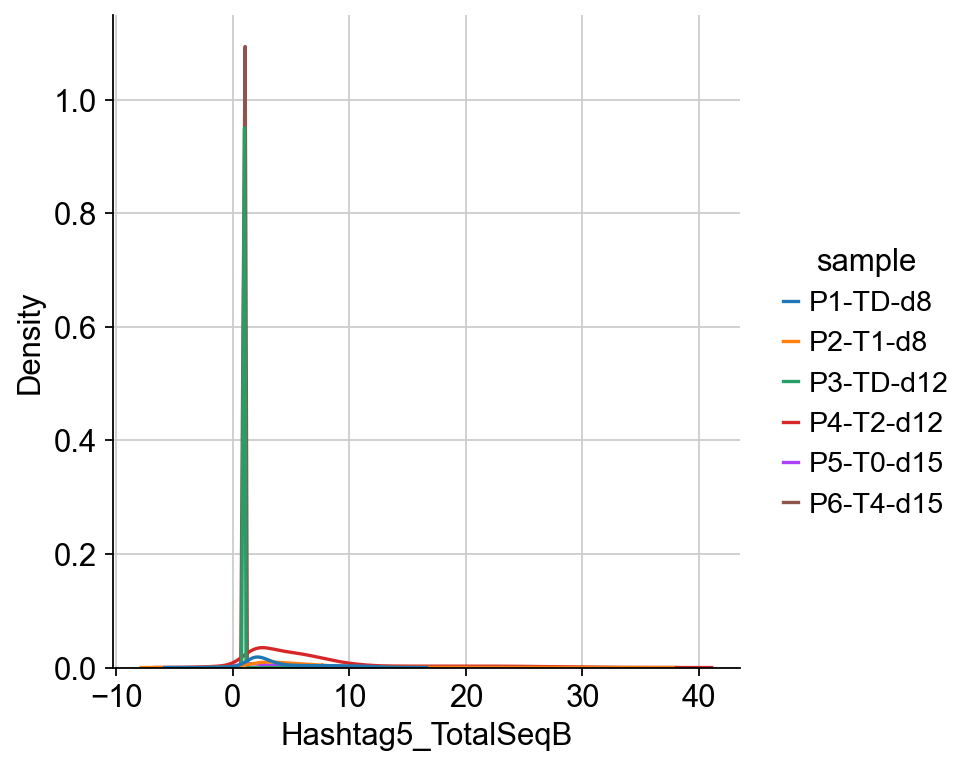

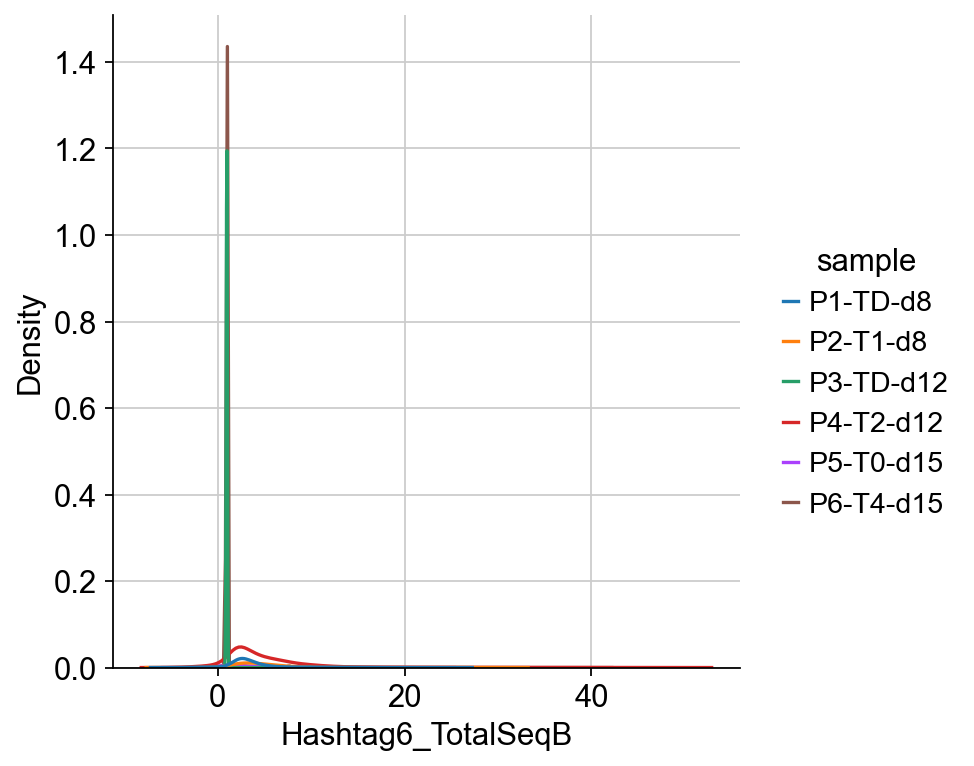

In [9]:
sns.displot(data=hash_data, x="Hashtag1_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data, x="Hashtag2_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data, x="Hashtag3_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data, x="Hashtag4_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data, x="Hashtag5_TotalSeqB", hue="sample", kind="kde")
sns.displot(data=hash_data, x="Hashtag6_TotalSeqB", hue="sample", kind="kde")

In [10]:
hash_onoff = np.zeros((hash_data.shape[0], hash_data.shape[1]-2))
hash_dict = {'P1-TD-d8': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P2-T1-d8': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P3-TD-d12': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB'],
             'P4-T2-d12': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P5-T0-d15': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag5_TotalSeqB', 'Hashtag6_TotalSeqB'],
             'P6-T4-d15': ['Hashtag1_TotalSeqB', 'Hashtag2_TotalSeqB', 'Hashtag3_TotalSeqB', 'Hashtag4_TotalSeqB']}

In [11]:
hashtag_dict = {0: 'Hash 1',
                1: 'Hash 2',
                2: 'Hash 3',
                3: 'Hash 4',
                4: 'Hash 5',
                5: 'Hash 6'}

In [12]:
rna_sing.obs['hashtag'] = np.argmax(hash_onoff[np.where(rna.obs['hashing'].str.contains('1.0'))], axis=1)
rna_sing.obs['hashtag'] = rna_sing.obs['hashtag'].map(hashtag_dict)
prot_sing.obs['hashtag'] = rna_sing.obs['hashtag']

/var/folders/wb/0twtb9pj5rq2sw71djs3j1z00000gn/T/ipykernel_23295/3781449535.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  rna_sing.obs['hashtag'] = np.argmax(hash_onoff[np.where(rna.obs['hashing'].str.contains('1.0'))], axis=1)
/var/folders/wb/0twtb9pj5rq2sw71djs3j1z00000gn/T/ipykernel_23295/3781449535.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  prot_sing.obs['hashtag'] = rna_sing.obs['hashtag']


In [13]:
mdata_sing = MuData({"rna": rna_sing, "prot": prot_sing})

In [14]:
sc.tl.pca(rna_sing, svd_solver='arpack')

In [15]:
sc.pp.neighbors(rna_sing, n_neighbors=15, n_pcs=50)

In [16]:
sc.tl.umap(rna_sing)
leiden_map = {'0': 'CD45-', '1': 'CD45+'}
rna_sing.obs['CD45'] = rna_sing.obs['leiden'].map(leiden_map)

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


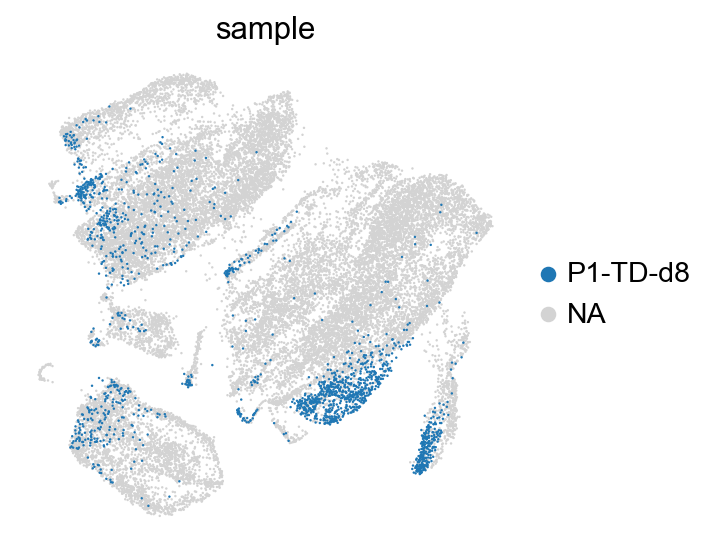

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


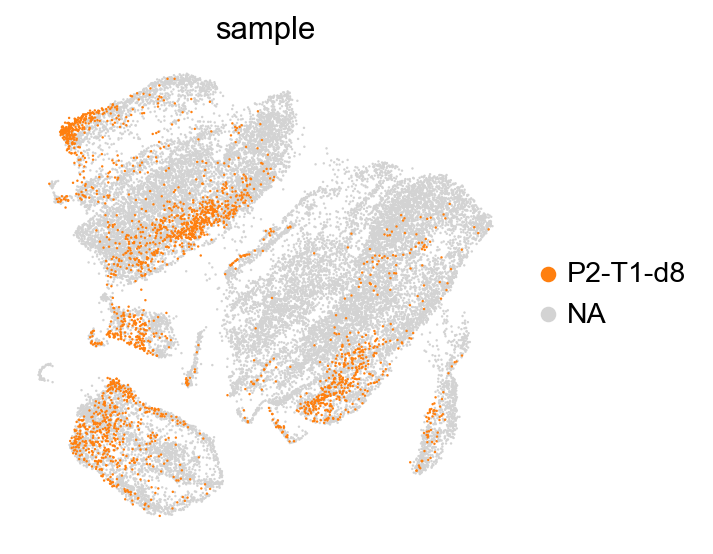

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


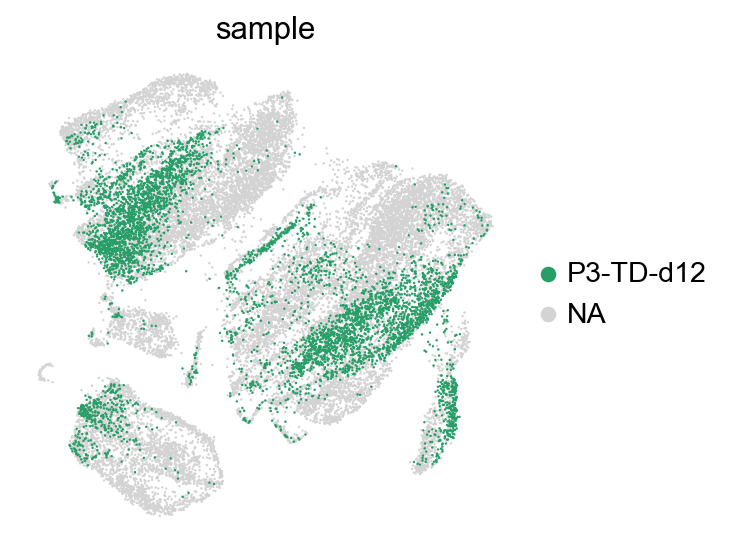

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


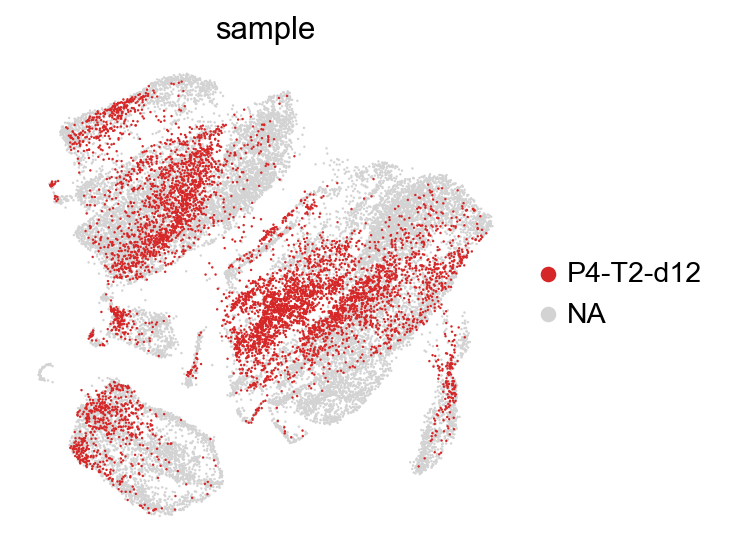

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


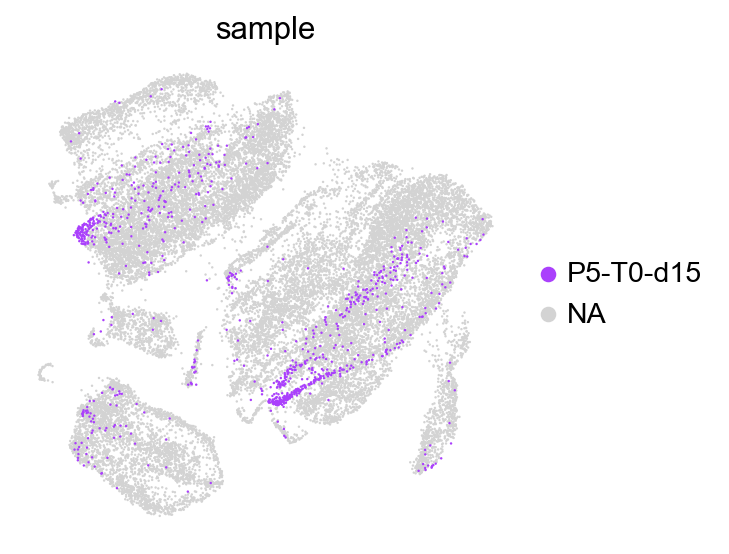

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


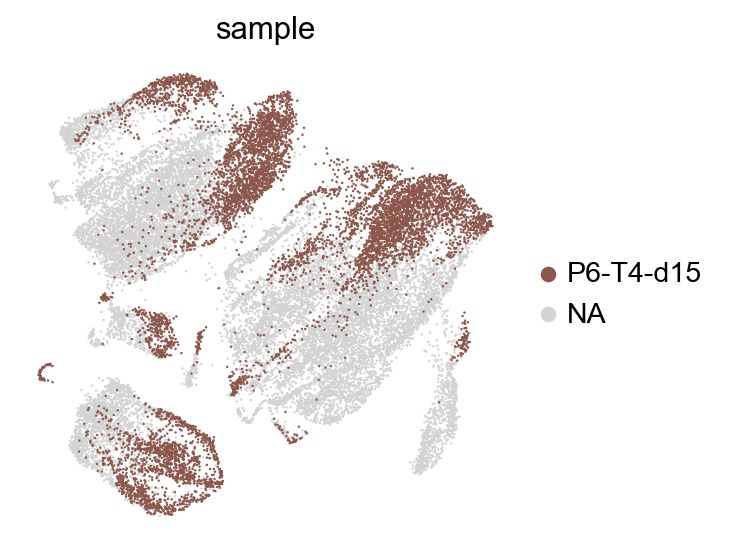

In [18]:
sc.pl.umap(rna_sing, color='sample', groups=['P1-TD-d8'])
sc.pl.umap(rna_sing, color='sample', groups=['P2-T1-d8'])
sc.pl.umap(rna_sing, color='sample', groups=['P3-TD-d12'])
sc.pl.umap(rna_sing, color='sample', groups=['P4-T2-d12'])
sc.pl.umap(rna_sing, color='sample', groups=['P5-T0-d15'])
sc.pl.umap(rna_sing, color='sample', groups=['P6-T4-d15'])


/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


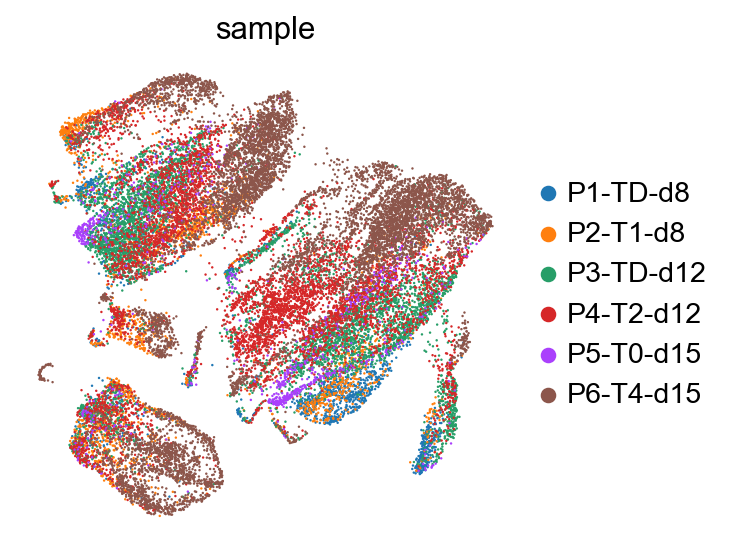

In [19]:
sc.pl.umap(rna_sing, color = 'sample')

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


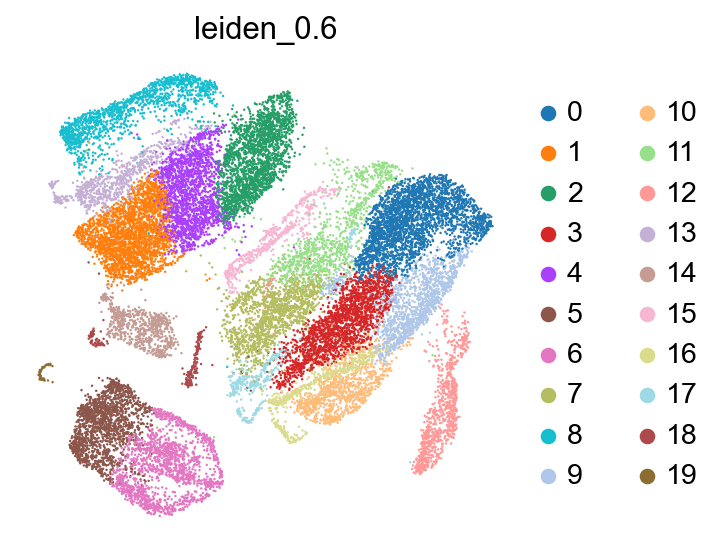

In [17]:
sc.tl.leiden(rna_sing, resolution = 0.6, key_added = 'leiden_0.6')
sc.pl.umap(rna_sing, color = 'leiden_0.6')

In [20]:
old_to_new = {
    "0":"Tumor cell",
    "1":"Macrophage",
    "2":"Macrophage",
    "3":"Tumor cell",
    "4":"Macrophage",
    "5":"T cell",
    "6":"T cell",
    "7":"Fibroblast",
    "8":"mregDC",
    "9":"Tumor cell",
    "10":"Tumor cell",
    "11":"Tumor cell",
    "12":"Activated Fibroblast",
    "13":"DC",
    "14":"Neutrophil",
    "15":"Endothelial cell",
    "16":"Tumor cell",
    "17":"Pericyte",
    "18":"Mast cell/Basophil",
    "19": "B cell"
}

/Users/anasuyadighe/anaconda3/envs/scrna/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


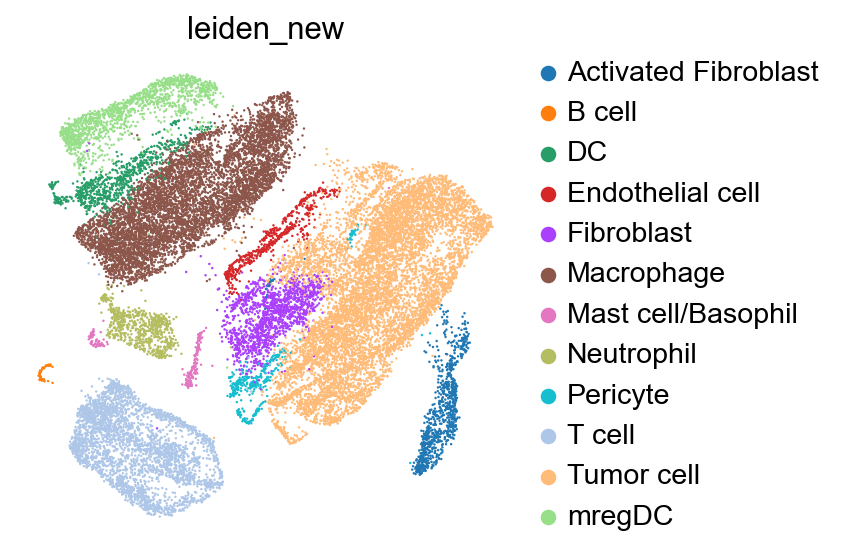

In [21]:
default_label = 'Unknown'
rna_sing.obs['leiden_new'] = (rna_sing.obs['leiden_0.6'].map(old_to_new).astype('category'))
sc.pl.umap(rna_sing, color = 'leiden_new')

In [22]:
rna_sing

AnnData object with n_obs × n_vars = 25020 × 19059
    obs: 'sample', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'hashing', 'leiden', 'hashtag', 'CD45', 'leiden_0.6', 'leiden_new'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hashing_colors', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap', 'leiden_0.6_colors', 'leiden_new_colors'
    obsm: 'X_pca', 'X_umap', 'hash_onoff'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [23]:
prot_sing

AnnData object with n_obs × n_vars = 25020 × 27
    obs: 'sample', 'hashtag'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [27]:
prot_sing.var['feature_types']

Hashtag1_TotalSeqB         Antibody Capture
Hashtag2_TotalSeqB         Antibody Capture
Hashtag3_TotalSeqB         Antibody Capture
Hashtag4_TotalSeqB         Antibody Capture
Hashtag5_TotalSeqB         Antibody Capture
Hashtag6_TotalSeqB         Antibody Capture
Ly6C_TotalSeqB             Antibody Capture
MHCII_TotalSeqB            Antibody Capture
CD64_TotalSeqB             Antibody Capture
CSF1R_TotalSeqB            Antibody Capture
CCR2_TotalSeqB             Antibody Capture
CX3CR1_TotalSeqB           Antibody Capture
XCR1_TotalSeqB             Antibody Capture
SIRPa_TotalSeqB            Antibody Capture
CCR7_TotalSeqB             Antibody Capture
CD40_TotalSeqB             Antibody Capture
CD86_TotalSeqB             Antibody Capture
PDL1_TotalSeqB             Antibody Capture
CD11b_TotalSeqB            Antibody Capture
CD301b_TotalSeqB           Antibody Capture
Tim3_TotalSeqB             Antibody Capture
Lag3_TotalSeqB             Antibody Capture
CD163_TotalSeqB            Antib

In [25]:
prot_sing.var['feature_types'][0]

'Antibody Capture'

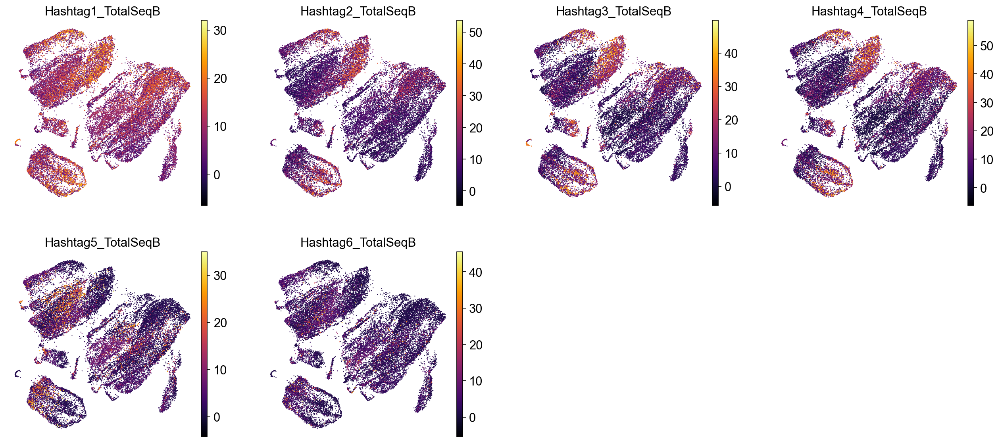

In [29]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["Hashtag1_TotalSeqB","Hashtag2_TotalSeqB",
                       "Hashtag3_TotalSeqB","Hashtag4_TotalSeqB",
                      "Hashtag5_TotalSeqB","Hashtag6_TotalSeqB"])

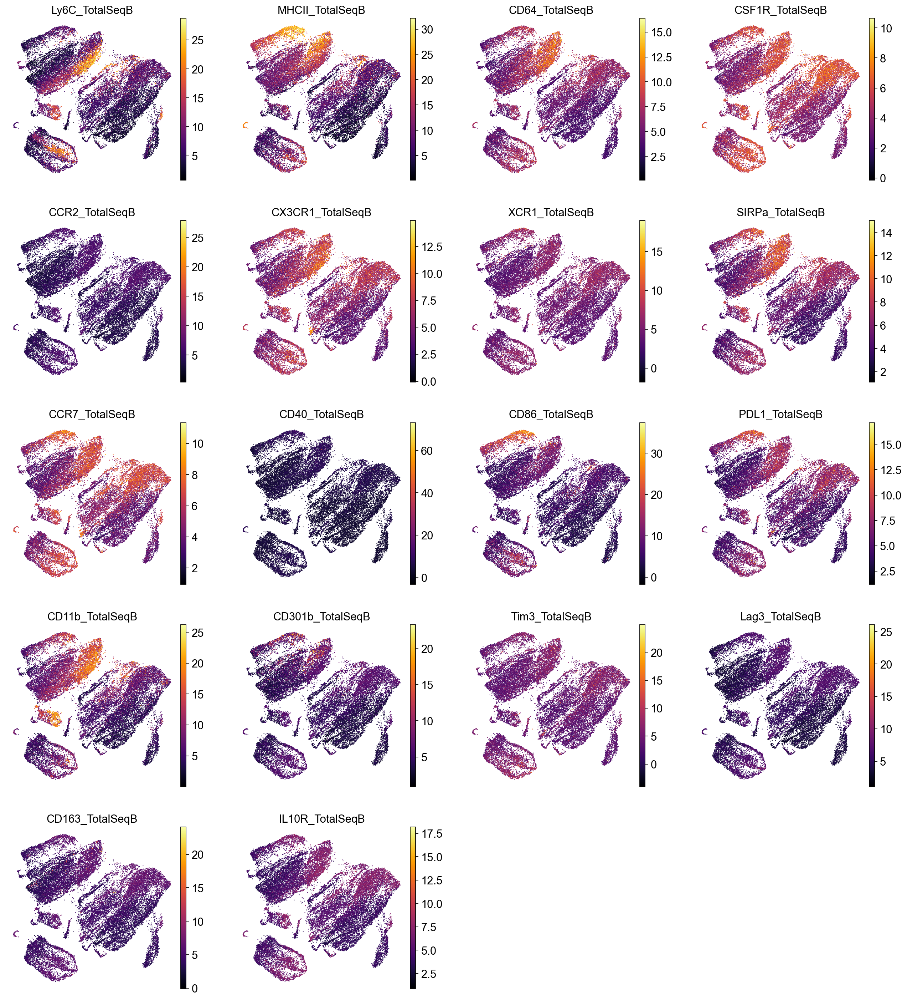

In [30]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["Ly6C_TotalSeqB","MHCII_TotalSeqB",
                        "CD64_TotalSeqB","CSF1R_TotalSeqB",
                        "CCR2_TotalSeqB","CX3CR1_TotalSeqB",
                       "XCR1_TotalSeqB","SIRPa_TotalSeqB",
                       "CCR7_TotalSeqB","CD40_TotalSeqB",
                        "CD86_TotalSeqB","PDL1_TotalSeqB",
                       "CD11b_TotalSeqB","CD301b_TotalSeqB",
                        "Tim3_TotalSeqB","Lag3_TotalSeqB",
                       "CD163_TotalSeqB","IL10R_TotalSeqB"])





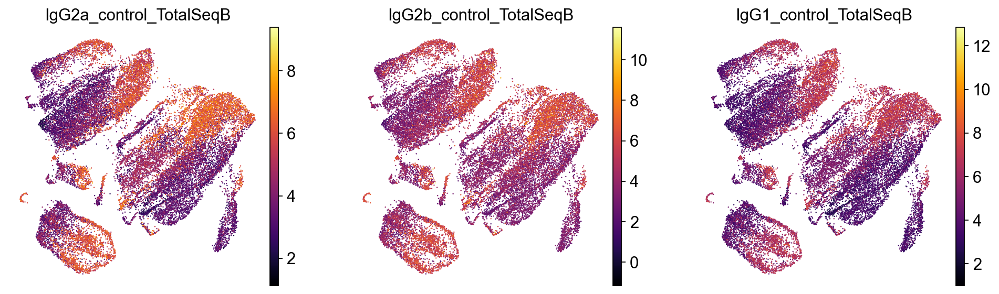

In [45]:

mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color=["IgG2a_control_TotalSeqB","IgG2b_control_TotalSeqB","IgG1_control_TotalSeqB"])

In [ ]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", cmap = 'inferno',
                color="CD40_TotalSeqB", vmax = 15)





In [ ]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", color=["Ly6C_TotalSeqB","MHCII_TotalSeqB","CX3CR1_TotalSeqB","CD40_TotalSeqB"])

In [ ]:
mdata_sing

In [ ]:
len(rna_sing.obs.leiden_new.cat.categories)

In [ ]:
mu.pp.intersect_obs(mdata_sing)

In [ ]:
mu.tl.leiden(mdata_sing, resolution=[2, .1], random_state=1)

In [ ]:
mdata_sing.uns['leiden']

In [ ]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", color="Ly6C_TotalSeqB")

In [ ]:
mu.pl.embedding(mdata_sing, basis="rna:X_umap", color= "leiden")

In [ ]:
sc.pp.highly_variable_genes(rna_sing, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pl.highly_variable_genes(rna_sing)
np.sum(rna_sing.var.highly_variable)

In [ ]:
sc.pp.highly_variable_genes(prot_sing, min_mean=0.02, max_mean=4, min_disp=0.5)
sc.pl.highly_variable_genes(prot_sing)
np.sum(prot_sing.var.highly_variable)

In [ ]:
mu.tl.mofa(mdata_sing, outfile="MOFA_try1_citeseq.hdf5",
           n_factors=30)